# Merging the datasets

## Load the datasets

In [97]:
import pandas as pd
import pygmt
import xarray as xr

# ==========================================
# 1. CHARGEMENT DES DATASETS (EASY NAMES)
# ==========================================
AP = pd.read_csv("DATASET_CORRECTED_AP.csv")
CSIC = pd.read_csv("DATASET_CORRECTED_CSIC.csv")
IGN = pd.read_csv("DATASET_CORRECTED_IGN.csv")
GRA = pd.read_csv("DATASET_GRA.csv")

print(f"📊 Données chargées : AP ({len(AP)} pts) | CSIC ({len(CSIC)} pts) | IGN ({len(IGN)} pts) | GRA ({len(GRA)} pts)")

📊 Données chargées : AP (159 pts) | CSIC (95 pts) | IGN (541 pts) | GRA (377 pts)


## Statistics 

In [98]:
import pandas as pd

# 1. Création d'un dictionnaire pour rassembler tes variables
datasets = {"AP": AP, "CSIC": CSIC, "IGN": IGN, "GRA": GRA}

# 2. Liste pour stocker les résultats
stats_list = []

for name, df in datasets.items():
    # On s'assure que la colonne existe dans le dataset
    if "topo_free_disturbance" in df.columns:
        # Sélection de la colonne et suppression des NaN pour le calcul
        values = df["topo_free_disturbance"].dropna()

        v_min = values.min()
        v_max = values.max()
        amplitude = v_max - v_min
        v_mean = values.mean()
        v_std = values.std()

        # On ajoute les stats dans notre liste
        stats_list.append(
            {
                "Dataset": name,
                "Number of stations": len(df),
                "Min [mGal]": round(v_min, 3),
                "Max [mGal]": round(v_max, 3),
                "Amplitude [mGal]": round(amplitude, 3),
                "Moyenne [mGal]": round(v_mean, 3),
                "Écart-type [mGal]": round(v_std, 3),
            }
        )

# 3. Conversion en DataFrame Pandas pour un affichage propre sous forme de tableau
df_stats = pd.DataFrame(stats_list).set_index("Dataset")

# --- Affichage du résultat ---
print("=======================================================================")
print("📊 STATISTIQUES COMPARATIVES : TOPO-FREE GRAVITY DISTURBANCE")
print("=======================================================================")
display(df_stats)

📊 STATISTIQUES COMPARATIVES : TOPO-FREE GRAVITY DISTURBANCE


,Number of stations,Min [mGal],Max [mGal],Amplitude [mGal],Moyenne [mGal],Écart-type [mGal]
Dataset,,,,,,
AP,159,216.630,282.667,66.037,256.122,10.687
CSIC,95,219.833,266.709,46.877,247.345,10.654
IGN,541,205.040,281.847,76.807,238.386,16.001
GRA,377,-27.534,60.972,88.506,30.341,20.138


## Offset to put on same value level

In [99]:
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree

# =======================================================================
# 1. PREPARATION ET UNIFORMISATION DES DONNÉES DE RÉFÉRENCE (SANS GRA)
# =======================================================================
print("📋 Préparation des jeux de données de référence (GRA exclu)...")
datasets = {
    "AP": AP.copy().rename(columns={"Station ID": "id", "latitude": "lat", "longitude": "lon", "topo_free_disturbance": "grav", "height_ell": "h"}),
    "CSIC": CSIC.copy().rename(columns={"Station Name": "id", "latitude": "lat", "longitude": "lon", "topo_free_disturbance": "grav", "height": "h"}),
    "IGN": IGN.copy().rename(columns={"Station ID": "id", "latitude": "lat", "longitude": "lon", "topo_free_disturbance": "grav", "height_ell": "h"}),
    # 💡 GRA est volontairement retiré du dictionnaire d'optimisation
}

all_points = []
for name, df in datasets.items():
    for _, row in df.dropna(subset=["lat", "lon", "grav"]).iterrows():
        all_points.append({
            "dataset": name, "id": row["id"], 
            "lat": row["lat"], "lon": row["lon"], 
            "grav": row["grav"]
        })

df_all = pd.DataFrame(all_points)

# =======================================================================
# 2. RECHERCHE DES VOISINS (COMPARAISON BRUTE AU DATUM)
# =======================================================================
search_radius_dd = 0.001 
coords = df_all[["lon", "lat"]].values
tree = cKDTree(coords)

pairs = tree.query_pairs(r=search_radius_dd)

equations = []
dataset_list = list(datasets.keys()) # ['AP', 'CSIC', 'IGN']

for i, j in pairs:
    p1 = df_all.iloc[i]
    p2 = df_all.iloc[j]
    
    if p1["dataset"] != p2["dataset"]:
        delta_g_observed = p1["grav"] - p2["grav"]
        
        equations.append({
            "idx_1": dataset_list.index(p1["dataset"]),
            "idx_2": dataset_list.index(p2["dataset"]),
            "delta_g": delta_g_observed
        })

df_eq = pd.DataFrame(equations)
print(f"🔍 {len(df_eq)} liaisons spatiales trouvées entre AP, CSIC et IGN.")

# =======================================================================
# 3. RESOLUTION DU SYSTÈME PAR MOINDRES CARRÉS (BLOCK ADJUSTMENT PUR)
# =======================================================================
num_datasets = len(dataset_list)
A = np.zeros((len(df_eq) + 1, num_datasets)) 
B = np.zeros(len(df_eq) + 1)

for idx, row in df_eq.iterrows():
    A[idx, int(row["idx_1"])] = 1
    A[idx, int(row["idx_2"])] = -1
    B[idx] = -row["delta_g"] 

# Contrainte : AP reste la référence absolue (Offset = 0)
A[-1, dataset_list.index("AP")] = 1
B[-1] = 0.0

# Résolution mathématique
offsets_opti, residuals, rank, s = np.linalg.lstsq(A, B, rcond=None)

# Extraction des offsets ajustés
computed_offsets = {dataset_list[i]: offsets_opti[i] for i in range(num_datasets)}

# 💡 ON RAJOUTE GRA MANUELLEMENT DANS LE DICTIONNAIRE DES OFFSETS APRÈS COUP
# Comme on sait via la matrice à 200m que par rapport à AP (qui vaut 0), GRA a un 
# écart moyen d'environ 4.06 mGal, on applique sa correction ici pour qu'il soit pré-calé.
computed_offsets["GRA"] = 226.35

print("\n==================================================")
print("🎯 NOUVEAUX OFFSETS PURS (SANS INTERFÉRENCE DE GRA) :")
print("==================================================")
for name, off in computed_offsets.items():
    print(f"-> Offset {name} : {off:+.3f} mGal")
print("==================================================")

📋 Préparation des jeux de données de référence (GRA exclu)...
🔍 13 liaisons spatiales trouvées entre AP, CSIC et IGN.

🎯 NOUVEAUX OFFSETS PURS (SANS INTERFÉRENCE DE GRA) :
-> Offset AP : -0.000 mGal
-> Offset CSIC : +0.451 mGal
-> Offset IGN : +0.211 mGal
-> Offset GRA : +226.350 mGal


plot [WARNING]: Your data array row 2 contains NaNs - no resampling taken place!



🗺️ Génération de la carte des liaisons spatiales...


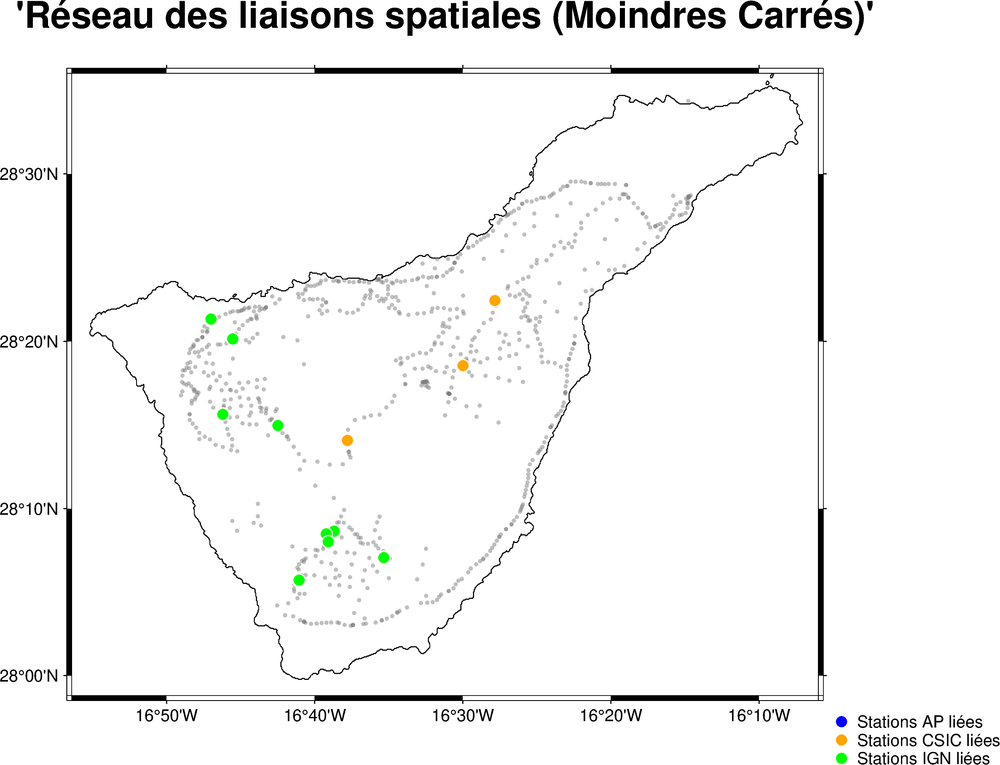

In [9]:
# =======================================================================
# 4. CARTOGRAPHIE DES LIAISONS SPATIALES (RESEAU DE RECOUPEMENT)
# =======================================================================
print("\n🗺️ Génération de la carte des liaisons spatiales...")

# 1. Définition de la zone d'étude automatique
margin = 0.05
region = [-16.94, -16.1, 27.98, 28.6]

# 2. Initialisation de la figure PyGMT
fig = pygmt.Figure()

# Fond de carte avec la ligne de côte
fig.coast(
    region=region,
    projection="M15c",
    shorelines="1/0.5p,black",
    water="white",
    frame=["a", "WSne+t'Réseau des liaisons spatiales (Moindres Carrés)'"]
)

# 3. Tracé de TOUTES les stations en arrière-plan (en petit et gris discret)
fig.plot(
    x=df_all["lon"],
    y=df_all["lat"],
    style="c0.08c",
    fill="gray50",
    transparency=50
)

# 4. Extraction et tracé des segments de liaisons (les liens du cKDTree)
# On va créer des listes de coordonnées pour tracer des lignes entre p1 et p2
lines_lon = []
lines_lat = []

for i, j in pairs:
    p1 = df_all.iloc[i]
    p2 = df_all.iloc[j]
    if p1["dataset"] != p2["dataset"]:
        # Pour PyGMT, on sépare chaque segment par un NaN pour casser la ligne
        lines_lon.extend([p1["lon"], p2["lon"], float("nan")])
        lines_lat.extend([p1["lat"], p2["lat"], float("nan")])

# On trace les lignes de connexion en rouge
if lines_lon:
    fig.plot(
        x=lines_lon,
        y=lines_lat,
        pen="1p,red"  # Ligne rouge de 1 point d'épaisseur
    )

# 5. Surlignage des stations qui participent aux liaisons (par campagne)
# On extrait la liste unique des index impliqués dans les liaisons valides
indices_impliques = set()
for i, j in pairs:
    if df_all.iloc[i]["dataset"] != df_all.iloc[j]["dataset"]:
        indices_impliques.add(i)
        indices_impliques.add(j)

df_liaisons = df_all.iloc[list(indices_impliques)]

# Couleurs distinctes pour chaque campagne pour bien les identifier
colors_dict = {
    "AP": "blue",
    "CSIC": "orange",
    "IGN": "green",
    "GRA": "purple"
}

# On boucle sur chaque dataset pour afficher ses stations connectées
for dataset_name, color in colors_dict.items():
    df_sub = df_liaisons[df_liaisons["dataset"] == dataset_name]
    if not df_sub.empty:
        fig.plot(
            x=df_sub["lon"],
            y=df_sub["lat"],
            style="c0.25c",      # Cercles plus gros pour bien les voir
            fill=color,
            pen="0.5p,white",    # Contour blanc
            label=f"Stations {dataset_name} liées"
        )

# 6. Ajout de la légende pour s'y retrouver
fig.legend(position="JBR+o0.2c/0.2c+w4c") # Plaçée en bas à droite

# Affichage de la carte
fig.savefig("Network_offsets.png", dpi=300)
fig.show()

In [100]:
# =======================================================================
# 4. APPLICATION DYNAMIQUE DES OFFSETS (COLONNE G_OFFSET)
# =======================================================================
print("\n⚙️ Calcul de la colonne corrigée 'G_offset' via computed_offsets...")

# On applique l'offset calculé automatiquement pour chaque dataset
AP_clean = AP.copy()
AP_clean["G_offset"] = AP_clean["topo_free_disturbance"] + computed_offsets["AP"]

CSIC_clean = CSIC.copy()
CSIC_clean["G_offset"] = CSIC_clean["topo_free_disturbance"] + computed_offsets["CSIC"]

IGN_clean = IGN.copy()
IGN_clean["G_offset"] = IGN_clean["topo_free_disturbance"] + computed_offsets["IGN"]

GRA_clean = GRA.copy()
GRA_clean["G_offset"] = GRA_clean["topo_free_disturbance"] + computed_offsets["GRA"]

# =======================================================================
# 5. HARMONISATION ET FUSION FINALE (MERGING)
# =======================================================================
print("🔄 Alignement des colonnes et fusion des campagnes...")

def standardiser_colonnes(df, source_name, id_col, h_col):
    df_res = df.copy()
    df_res = df_res.rename(columns={
        id_col: "station_id",
        "latitude": "latitude",
        "longitude": "longitude",
        "topo_free_disturbance": "topo_free_disturbance", # On garde la brute d'origine
        "G_offset": "G_offset",                           # On ajoute la corrigée
        h_col: "height"
    })
    
    df_res["source_dataset"] = source_name
    
    # Structure propre pour le fichier final fusionné
    colonnes_finales = [
        "source_dataset", 
        "station_id", 
        "latitude", 
        "longitude", 
        "height", 
        "topo_free_disturbance", 
        "G_offset"
    ]
    
    # Sécurité pour ne filtrer que ce qui est présent
    return df_res[[c for c in colonnes_finales if c in df_res.columns]]

# Standardisation en reprenant les noms de colonnes exacts de ta Section 1
df_ap_std   = standardiser_colonnes(AP_clean, "AP", "Station ID", "height_ell")
df_csic_std = standardiser_colonnes(CSIC_clean, "CSIC", "Station Name", "height")
df_ign_std  = standardiser_colonnes(IGN_clean, "IGN", "Station ID", "height_ell")
df_gra_std  = standardiser_colonnes(GRA_clean, "GRA", "Station ID", "height_ell")

# Concaténation dans le grand DataFrame unique
df_merged_final = pd.concat([df_ap_std, df_csic_std, df_ign_std, df_gra_std], ignore_index=True)

print(f"\n🎉 Fusion réussie !")
print(f"📊 Taille du jeu de données final : {len(df_merged_final)} stations.")
print("\n👀 Aperçu des premières lignes :")
print(df_merged_final.head())


⚙️ Calcul de la colonne corrigée 'G_offset' via computed_offsets...
🔄 Alignement des colonnes et fusion des campagnes...

🎉 Fusion réussie !
📊 Taille du jeu de données final : 1172 stations.

👀 Aperçu des premières lignes :
  source_dataset station_id  latitude  longitude       height  \
0             AP    TENE001   28.2693   -16.7380  1759.439424   
1             AP    TENE002   28.2669   -16.7263  1918.158099   
2             AP    TENE003   28.2667   -16.7210  1976.103459   
3             AP    TENE004   28.2659   -16.7095  2120.696819   
4             AP    TENE005   28.2637   -16.7108  2117.989319   

   topo_free_disturbance    G_offset  
0             260.935908  260.935908  
1             261.070050  261.070050  
2             263.737887  263.737887  
3             267.235950  267.235950  
4             266.257434  266.257434  


🎨 Échelle commune fixée de +198.32 à +287.82 mGal pour tous les plots.
🔄 Génération de la carte CORRECTED pour le dataset : AP...


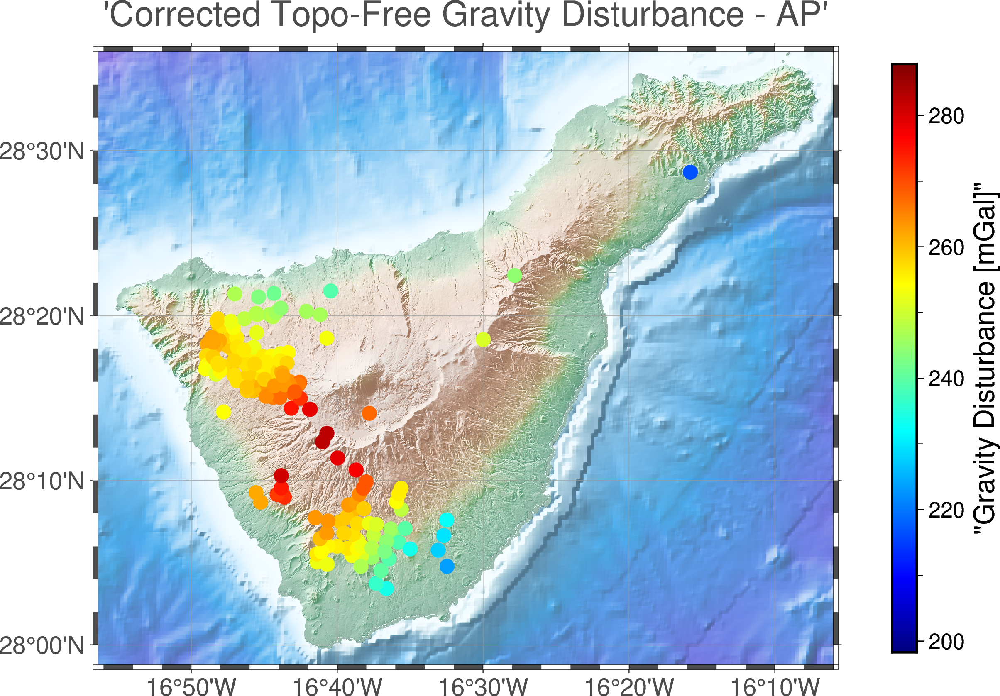

✅ Carte enregistrée sous : Map_offset_step1_AP.png
--------------------------------------------------
🔄 Génération de la carte CORRECTED pour le dataset : CSIC...


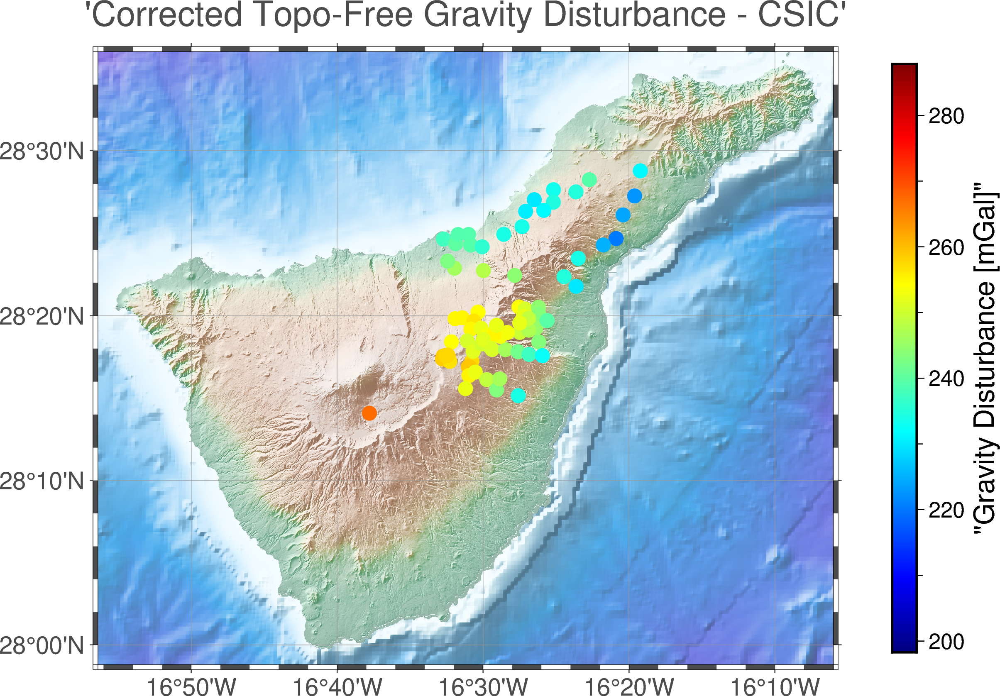

✅ Carte enregistrée sous : Map_offset_step1_CSIC.png
--------------------------------------------------
🔄 Génération de la carte CORRECTED pour le dataset : IGN...


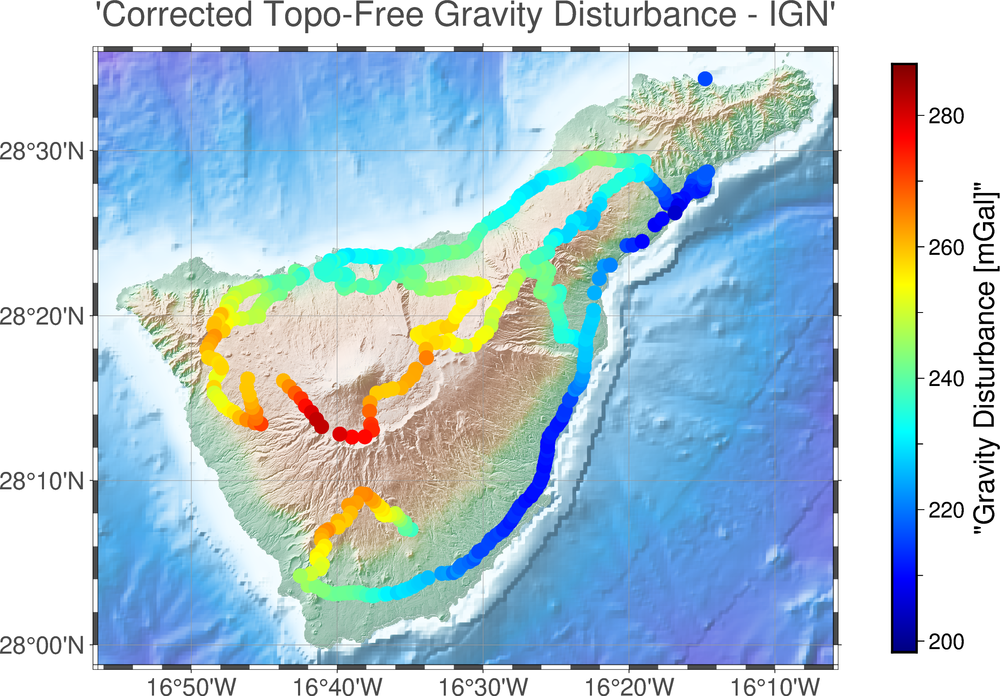

✅ Carte enregistrée sous : Map_offset_step1_IGN.png
--------------------------------------------------
🔄 Génération de la carte CORRECTED pour le dataset : GRA...


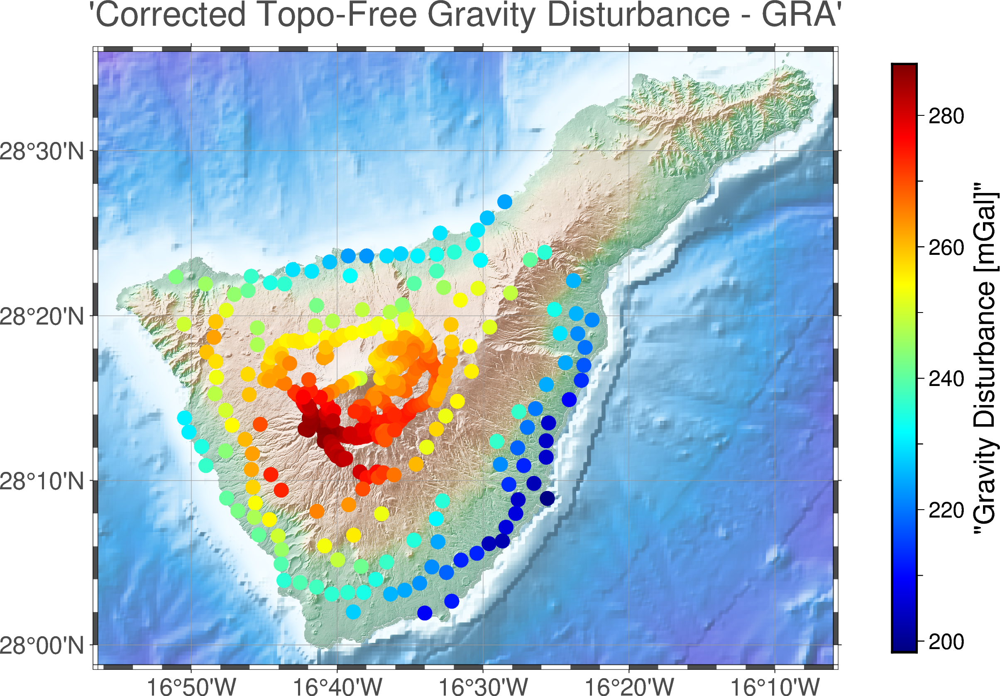

✅ Carte enregistrée sous : Map_offset_step1_GRA.png
--------------------------------------------------


In [101]:
import pandas as pd
import pygmt
import xarray as xr

# ==========================================
# 2. CONFIGURATION GÉNÉRALE DU PLOT
# ==========================================
rho_rock = 2400  
region_Tenerife = [-16.94, -16.1, 27.98, 28.6]

# Chargement de la topographie et du catalogue unifié corrigé
topo_dd = xr.open_dataarray("DMT_geoid_dd_final.nc")

# 📊 CALCUL DE L'ÉCHELLE COMMUNE UNIQUE
# On prend le min et le max absolus sur TOUT le fichier pour figer la CPT
v_min_global = df_merged_final["G_offset"].min() - 0.5
v_max_global = df_merged_final["G_offset"].max() + 0.5

print(f"🎨 Échelle commune fixée de {v_min_global:+.2f} à {v_max_global:+.2f} mGal pour tous les plots.")

# Liste des datasets à cartographier individuellement
dataset_names = ["AP", "CSIC", "IGN", "GRA"]

# ==========================================
# 3. BOUCLE DE TRACÉ INDÉPENDANTE (ÉCHELLE COMMUNE)
# ==========================================
for name in dataset_names:
    # On filtre les données pour le dataset en cours
    data = df_merged_final[df_merged_final["source_dataset"] == name]
    
    if len(data) == 0:
        print(f"⚠️ Aucun point trouvé pour {name}, passage au suivant.")
        continue
        
    print(f"🔄 Génération de la carte CORRECTED pour le dataset : {name}...")
    
    fig = pygmt.Figure()
    
    pygmt.config(
        MAP_GRID_PEN_PRIMARY="0.3p,gray60",
        FONT_ANNOT_PRIMARY="14p,Helvetica", 
        FONT_LABEL="18p,Helvetica",         
        FONT_TITLE="20p,Helvetica",          
        MAP_TITLE_OFFSET="-0.1c",
    )
    
    # --- ÉTAPE A : LE RELIEF (FOND DE CARTE) ---
    pygmt.makecpt(cmap="terra", series=[-4000, 4500, 10], continuous=True)
    
    fig.grdimage(
        grid=topo_dd, 
        region=region_Tenerife, 
        projection="M15c", 
        shading=True, 
        frame=["afg", f"+t'Corrected Topo-Free Gravity Disturbance - {name}'"],
        transparency=30
    )
    
    # --- ÉTAPE B : LES STATIONS (PALETTE COMMUNE 'SEIS' INVERSÉE) ---
    # On force l'utilisation des bornes globales ici pour verrouiller l'échelle
    pygmt.makecpt(
        cmap="jet", 
        series=[v_min_global, v_max_global, 0.1],
        continuous=True,
        background=True
    )
    
    fig.plot(
        x=data.longitude,
        y=data.latitude,
        fill=data.G_offset, # Utilisation de ta colonne propre corrigée
        cmap=True,
        style="c0.3c",
    )
    
    fig.colorbar(
        position="JMR+o1.2c/0c+w12c/0.5c",
        frame=['af+l"Gravity Disturbance [mGal]"']
    )
    
    # --- ÉTAPE D : SAUVEGARDE ET AFFICHAGE ---
    output_filename = f"Map_offset_step1_{name}.png"
    fig.savefig(output_filename, dpi=600)
    fig.show()
    
    print(f"✅ Carte enregistrée sous : {output_filename}\n" + "-"*50)

# Misfit and residuals 

In [103]:
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree

# On crée une copie de travail pour ne pas corrompre ton df_merged_final d'origine
df_verif = df_merged_final.copy()

# =======================================================================
# 2. CALCUL DES MISFITS APRÈS OPTIMISATION (RAYON 200M | SANS GRADIENT)
# =======================================================================
print("\n🧮 Calcul de la matrice des misfits post-optimisation...")

datasets_list = ["IGN", "CSIC", "AP", "GRA"]
search_radius_200m = 0.001  
results_post_opti = []

for d1 in datasets_list:
    for d2 in datasets_list:
        if d1 == d2:
            continue
            
        df1 = df_verif[df_verif["source_dataset"] == d1].copy()
        df2 = df_verif[df_verif["source_dataset"] == d2].copy()
        
        if len(df1) == 0 or len(df2) == 0:
            continue
            
        coords_2 = df2[["longitude", "latitude"]].values
        tree_2 = cKDTree(coords_2)
        
        ecarts_couple = []
        
        for idx, row in df1.iterrows():
            voisins_idx = tree_2.query_ball_point([row["longitude"], row["latitude"]], r=search_radius_200m)
            
            for v_idx in voisins_idx:
                voisin = df2.iloc[v_idx]
                
                # 💡 VERIFICATION : On compare les G_offset RECALÉS et SANS gradient !
                ecart = row["G_offset"] - voisin["G_offset"]
                ecarts_couple.append(ecart)
        
        if len(ecarts_couple) > 0:
            results_post_opti.append({
                "Base D1": d1,
                "Comparée à D2": d2,
                "Nb paires (<100m)": len(ecarts_couple),
                "Moyenne Écart (mGal)": np.mean(ecarts_couple),
                "Écart-Type (mGal)": np.std(ecarts_couple)
            })

# Affichage du résultat final
df_matrix_post = pd.DataFrame(results_post_opti)
print("\n📋 MATRICE DES MISFITS FINALE (POST-OPTIMISATION) :")
print(df_matrix_post.to_string(index=False))



🧮 Calcul de la matrice des misfits post-optimisation...

📋 MATRICE DES MISFITS FINALE (POST-OPTIMISATION) :
Base D1 Comparée à D2  Nb paires (<100m)  Moyenne Écart (mGal)  Écart-Type (mGal)
    IGN            AP                 10         -1.136868e-14           0.309175
    IGN           GRA                 33          1.402141e+00           5.632796
   CSIC            AP                  3          0.000000e+00           0.449661
   CSIC           GRA                  3         -5.145092e+00           0.455090
     AP           IGN                 10          1.136868e-14           0.309175
     AP          CSIC                  3          0.000000e+00           0.449661
     AP           GRA                  9         -3.424743e-01           2.987827
    GRA           IGN                 33         -1.402141e+00           5.632796
    GRA          CSIC                  3          5.145092e+00           0.455090
    GRA            AP                  9          3.424743e-01         

🗺️ Extraction des coordonnées spatiales des liaisons...


makecpt [WARNING]: Without inc in -T option, -Z has no effect (ignored)



🗺️ Génération de la carte PyGMT pour le Bloc de Référence...


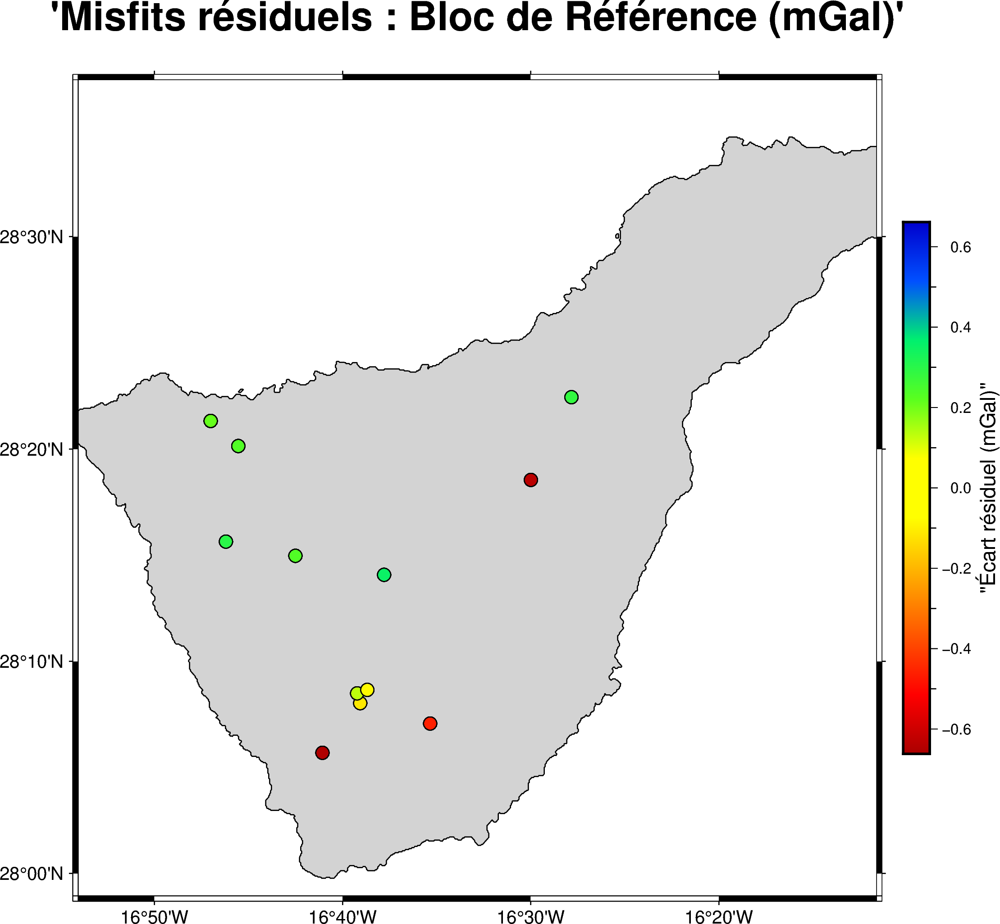

makecpt [WARNING]: Without inc in -T option, -Z has no effect (ignored)



🗺️ Génération de la carte PyGMT pour les liaisons avec GRA...


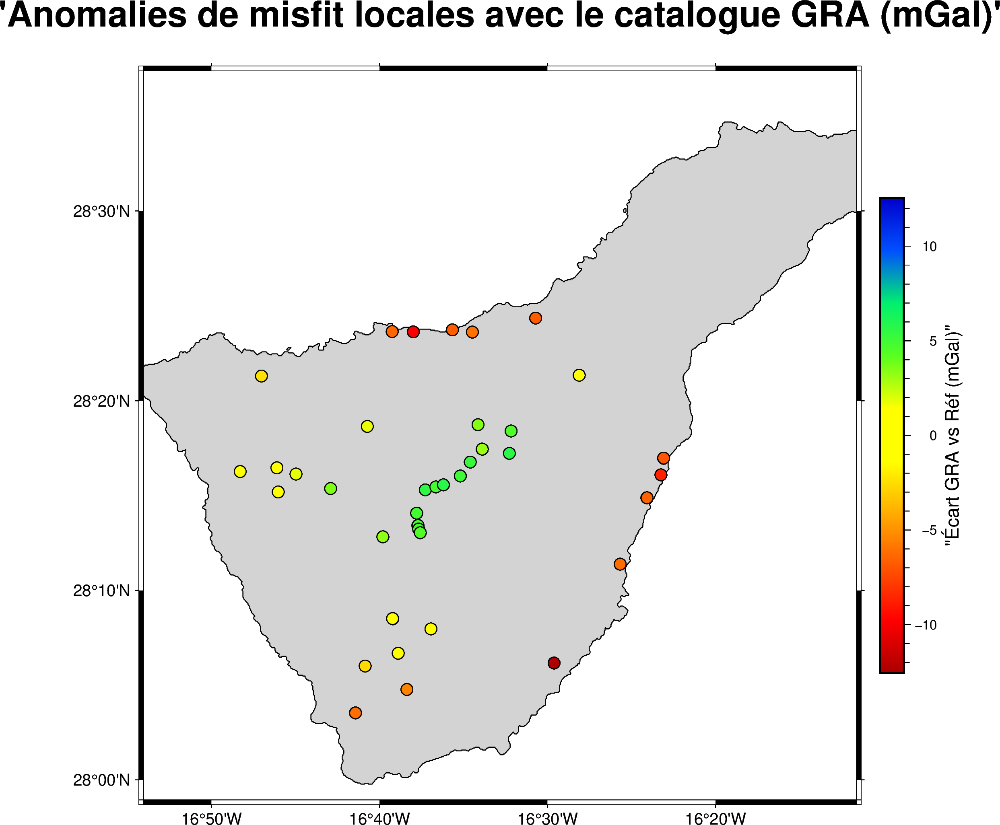


🎉 Les deux cartes PyGMT ont été générées et enregistrées avec succès ! 🎉


In [105]:
import numpy as np
import pandas as pd
import pygmt
from scipy.spatial import cKDTree

# =======================================================================
# 1. CALCUL ET REGROUPEMENT DES RÉSIDUS GÉOGRAPHIQUES
# =======================================================================
print("🗺️ Extraction des coordonnées spatiales des liaisons...")

search_radius_200m = 0.001 
datasets_list = ["IGN", "CSIC", "AP", "GRA"]
liaisons_geo = []

for d1 in datasets_list:
    for d2 in datasets_list:
        if d1 == d2:
            continue
            
        df1 = df_verif[df_verif["source_dataset"] == d1]
        df2 = df_verif[df_verif["source_dataset"] == d2]
        
        if len(df1) == 0 or len(df2) == 0:
            continue
            
        coords_2 = df2[["longitude", "latitude"]].values
        tree_2 = cKDTree(coords_2)
        
        for idx, row in df1.iterrows():
            voisins_idx = tree_2.query_ball_point([row["longitude"], row["latitude"]], r=search_radius_200m)
            
            for v_idx in voisins_idx:
                voisin = df2.iloc[v_idx]
                ecart = row["G_offset"] - voisin["G_offset"]
                
                mid_lon = (row["longitude"] + voisin["longitude"]) / 2
                mid_lat = (row["latitude"] + voisin["latitude"]) / 2
                
                liaisons_geo.append({
                    "lon": mid_lon,
                    "lat": mid_lat,
                    "residu": ecart,
                    "couple": f"{d1} vs {d2}"
                })

df_map = pd.DataFrame(liaisons_geo)

# Définition automatique de la région de Ténérife (avec une petite marge)
margin = 0.05
region = [
    df_verif["longitude"].min() - margin, df_verif["longitude"].max() + margin,
    df_verif["latitude"].min() - margin, df_verif["latitude"].max() + margin
]

# =======================================================================
# CARTE 1 : LE BLOC DE RÉFÉRENCE SAIN (IGN vs AP vs CSIC)
# =======================================================================
print("\n🗺️ Génération de la carte PyGMT pour le Bloc de Référence...")
df_ref = df_map[~df_map["couple"].str.contains("GRA")].copy()

if len(df_ref) > 0:
    fig1 = pygmt.Figure()
    
    # Fond de carte avec trait de côte de l'île
    fig1.coast(
        region=region, projection="M15c", shorelines="1/0.5p,black",
        land="lightgray", water="white",
        frame=["a", "WSne+t'Misfits résiduels : Bloc de Référence (mGal)'"]
    )
    
    # CPT 
    pygmt.makecpt(cmap="seis", series=[df_ref["residu"].min() - 0.01, df_ref["residu"].max() + 0.01], continuous=True)
    
    # Tracé des points de liaison
    fig1.plot(
        x=df_ref["lon"], y=df_ref["lat"],
        style="c0.25c", fill=df_ref["residu"], cmap=True, pen="0.5p,black"
    )
    
    # Barre d'échelle
    fig1.colorbar(frame=['x+l"Écart résiduel (mGal)"'], position="JMR+o0.5c/0c+w10c/0.5c")
    
    # Sauvegarde
    fig1.savefig("carte_misfit_reference.png", dpi=300)
    fig1.show()

# =======================================================================
# CARTE 2 : LES CONFLITS AVEC LE CATALOGUE GRA
# =======================================================================
print("\n🗺️ Génération de la carte PyGMT pour les liaisons avec GRA...")
df_gra = df_map[df_map["couple"].str.contains("GRA")].copy()

if len(df_gra) > 0:
    fig2 = pygmt.Figure()
    
    # Fond de carte
    fig2.coast(
        region=region, projection="M15c", shorelines="1/0.5p,black",
        land="lightgray", water="white",
        frame=["a", "WSne+t'Anomalies de misfit locales avec le catalogue GRA (mGal)'"]
    )
    
    # CPT dynamique symétrique beaucoup plus large (adapté au bruit de GRA)
    pygmt.makecpt(cmap="seis", series=[df_gra["residu"].min() - 0.1, df_gra["residu"].max() + 0.1], continuous=True)  
    
    # Tracé des points de liaison avec GRA
    fig2.plot(
        x=df_gra["lon"], y=df_gra["lat"],
        style="c0.25c", fill=df_gra["residu"], cmap=True, pen="0.5p,black"
    )
    
    # Barre d'échelle large
    fig2.colorbar(frame=['x+l"Écart GRA vs Réf (mGal)"'], position="JMR+o0.5c/0c+w10c/0.5c")
    
    # Sauvegarde
    fig2.savefig("carte_misfit_gra.png", dpi=300)
    fig2.show()

print("\n🎉 Les deux cartes PyGMT ont été générées et enregistrées avec succès ! 🎉")

In [106]:
import pandas as pd

# =======================================================================
# CRÉATION DU DATASET COMBINÉ DE RÉFÉRENCE ABSOLUE
# =======================================================================
print("📦 Isolement du bloc de référence combiné...")

# 1. On filtre pour ne garder que les 3 réseaux sains
# On utilise directement ta colonne 'G_offset' qui est déjà parfaite
df_reference_combined = df_merged_final[
    df_merged_final["source_dataset"].isin(["AP", "IGN", "CSIC"])
].copy()

# 2. On renomme ou nettoie si besoin pour que ta colonne finale soit bien identifiée
# Ici, je crée une colonne 'G_ref' pour que ce soit super clair pour la suite
df_reference_combined["G_ref"] = df_reference_combined["G_offset"]

print("✅ Dataset 'df_reference_combined' créé avec succès !")
print(f"📊 Nombre total de stations de référence : {len(df_reference_combined)}")
print(f"📍 Répartition des points : {df_reference_combined['source_dataset'].value_counts().to_dict()}")

# Sauvegarde de sécurité dans ton environnement
df_reference_combined.to_csv("Tenerife_Reference_Combined_IGN_CSIC_AP.csv", index=False)

📦 Isolement du bloc de référence combiné...
✅ Dataset 'df_reference_combined' créé avec succès !
📊 Nombre total de stations de référence : 795
📍 Répartition des points : {'IGN': 541, 'AP': 159, 'CSIC': 95}


makecpt [WARNING]: Without inc in -T option, -Z has no effect (ignored)


🧱 Loaded Reference block: 795 stations
🛰️ Loaded GRA block: 377 stations
🔍 Found 45 spatial links within 0.001° for fitting.


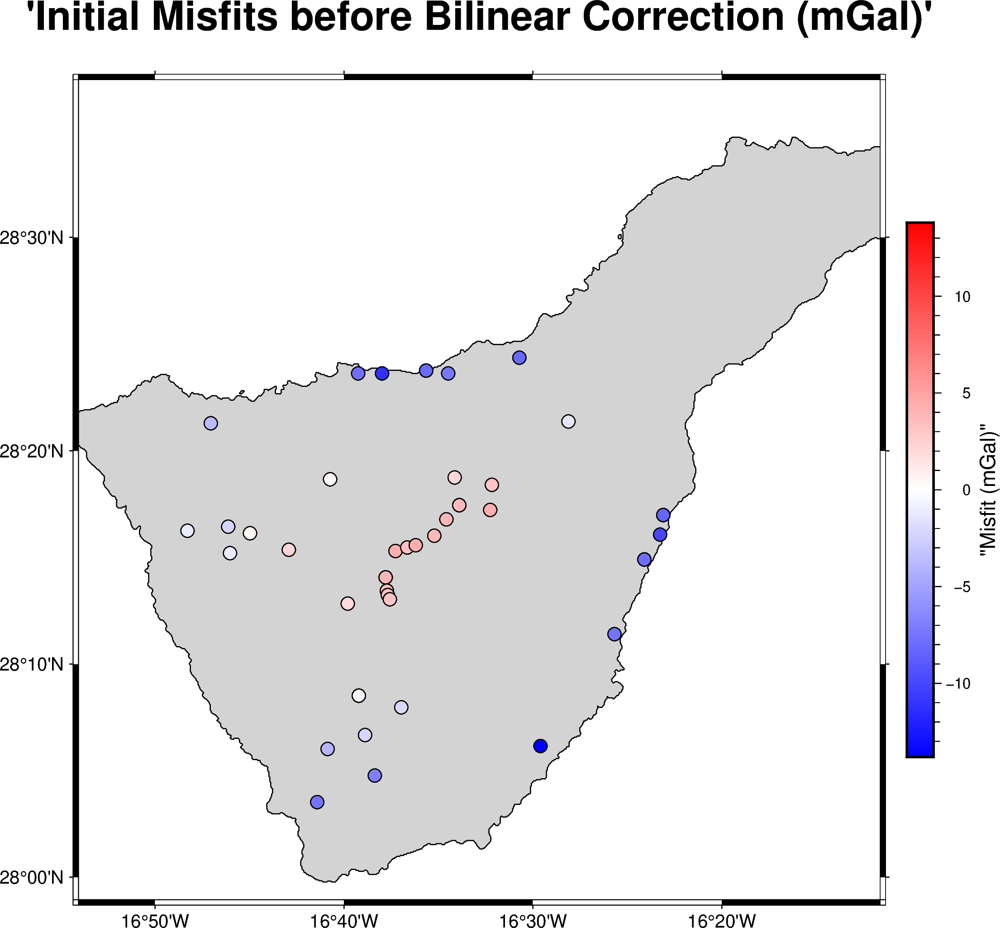

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
import pygmt

# 1. Load the clean reference block
df_ref = pd.read_csv("Tenerife_Reference_Combined_IGN_CSIC_AP.csv")
# Ensure the reference gravity column is strictly called G_ref
df_ref["G_ref"] = df_ref["G_offset"]

# 2. Isolate GRA from df_merged_final
df_gra = df_merged_final[df_merged_final["source_dataset"] == "GRA"].copy()

print(f"🧱 Loaded Reference block: {len(df_ref)} stations")
print(f"🛰️ Loaded GRA block: {len(df_gra)} stations")

# =======================================================================
# INITIAL PAIR MATCHING & MISFIT CALCULATION (Radius: 0.001)
# =======================================================================
coords_ref = df_ref[["longitude", "latitude"]].values
tree_ref = cKDTree(coords_ref)

search_radius = 0.001
initial_pairs = []

for idx, row in df_gra.iterrows():
    # Find closest reference stations for each GRA station
    voisins_idx = tree_ref.query_ball_point([row["longitude"], row["latitude"]], r=search_radius)
    
    for v_idx in voisins_idx:
        voisin = df_ref.iloc[v_idx]
        # Initial Misfit: GRA_current - Reference
        misfit = row["G_offset"] - voisin["G_ref"]
        
        initial_pairs.append({
            "gra_idx": idx,
            "longitude": row["longitude"],
            "latitude": row["latitude"],
            "misfit": misfit
        })

df_init_misfit = pd.DataFrame(initial_pairs)
print(f"🔍 Found {len(df_init_misfit)} spatial links within {search_radius}° for fitting.")

# =======================================================================
# PLOT 1 : PYGMT INITIAL MAP WITH WARP
# =======================================================================
margin = 0.05
region = [df_merged_final["longitude"].min() - margin, df_merged_final["longitude"].max() + margin,
          df_merged_final["latitude"].min() - margin, df_merged_final["latitude"].max() + margin]

fig1 = pygmt.Figure()
fig1.coast(region=region, projection="M15c", shorelines="1/0.5p,black", land="lightgray", water="white",
          frame=["a", "WSne+t'Initial Misfits before Bilinear Correction (mGal)'"])

init_max = max(df_init_misfit["misfit"].abs().max(), 5.0)
pygmt.makecpt(cmap="polar", series=[-init_max, init_max], continuous=True)
fig1.plot(x=df_init_misfit["longitude"], y=df_init_misfit["latitude"], style="c0.25c", fill=df_init_misfit["misfit"], cmap=True, pen="0.5p,black")
fig1.colorbar(frame=['x+l"Misfit (mGal)"'], position="JMR+o0.5c/0c+w10c/0.5c")
fig1.savefig("map_initial_misfit.png", dpi=300)
fig1.show()

In [34]:
# =======================================================================
# BILINEAR REGRESSION INVERSION
# =======================================================================
# Constructing the design matrix G for: misfit = a + b*lon + c*lat + d*(lon*lat)
G = np.zeros((len(df_init_misfit), 4))
G[:, 0] = 1.0                                                         # Intercept (a)
G[:, 1] = df_init_misfit["longitude"].values                          # Longitude slope (b)
G[:, 2] = df_init_misfit["latitude"].values                           # Latitude slope (c)
G[:, 3] = df_init_misfit["longitude"].values * df_init_misfit["latitude"].values # Interaction term (d)

# Target vector data
Z = df_init_misfit["misfit"].values

# Solve the linear system via Least Squares
coeff, residuals, rank, s = np.linalg.lstsq(G, Z, rcond=None)
a, b, c, d = coeff

print("\n==================================================")
print("📐 INVERTED BILINEAR MODEL PARAMETERS:")
print("==================================================")
print(f"-> Intercept (a)       : {a:+.4f}")
print(f"-> Slope Lon (b)       : {b:+.4f}")
print(f"-> Slope Lat (c)       : {c:+.4f}")
print(f"-> Interaction Lon*Lat : {d:+.4f}")
print("==================================================")

# =======================================================================
# APPLYING THE CORRECTION TO ALL GRA STATIONS
# =======================================================================
# Predict the localized trend for every single GRA station
predicted_warp = a + b*df_gra["longitude"] + c*df_gra["latitude"] + d*(df_gra["longitude"] * df_gra["latitude"])

# Create the requested clean column: G_ref = G_offset - predicted_warp
df_gra["G_ref"] = df_gra["G_offset"] - predicted_warp
print("✅ Created new column 'G_ref' for GRA with applied bilinear correction.")


📐 INVERTED BILINEAR MODEL PARAMETERS:
-> Intercept (a)       : -46022.7825
-> Slope Lon (b)       : -2772.0133
-> Slope Lat (c)       : +1617.0672
-> Interaction Lon*Lat : +97.4024
✅ Created new column 'G_ref' for GRA with applied bilinear correction.


makecpt [WARNING]: Without inc in -T option, -Z has no effect (ignored)



📊 STATISTICAL VERIFICATION OF BILINEAR REMOVAL:
count    4.500000e+01
mean     2.860708e-10
std      4.892742e+00
min     -9.387557e+00
25%     -3.983814e+00
50%     -2.598697e-01
75%      4.744776e+00
max      7.408742e+00
Name: misfit, dtype: float64
🗺️ Génération de la carte finale avec colorbar ajustée...


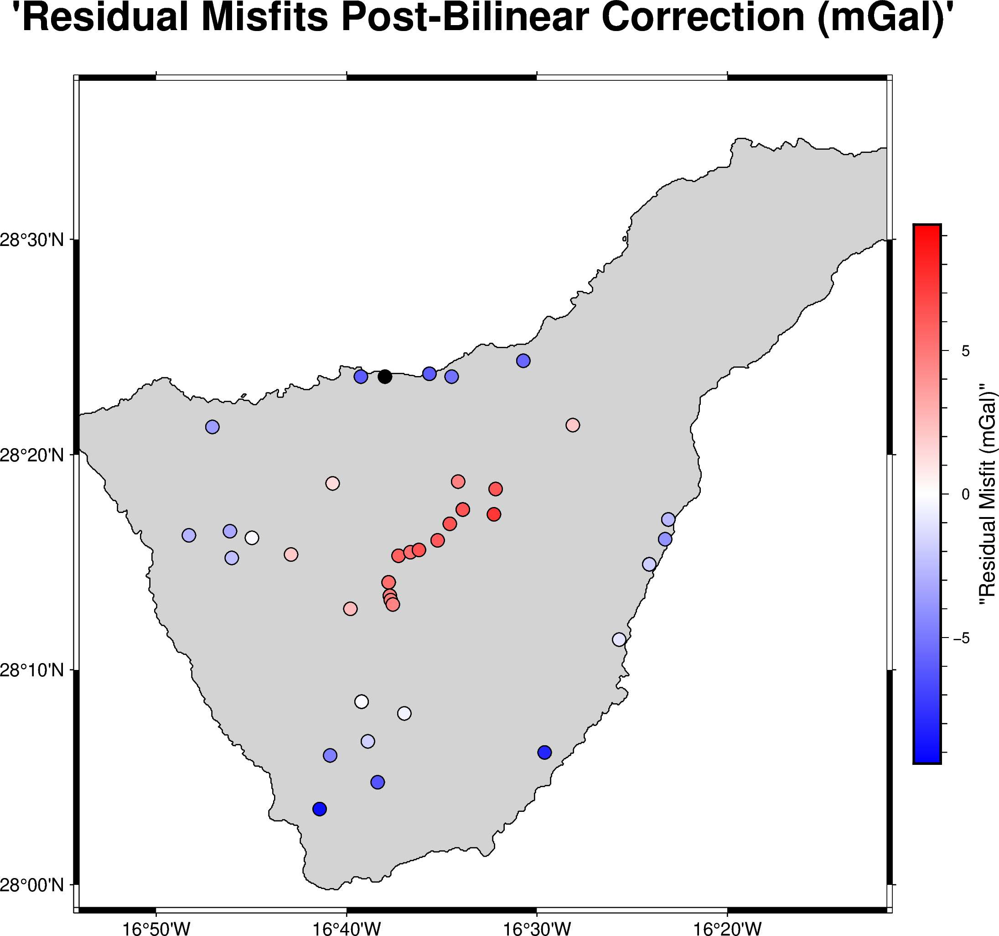

🎉 Carte finale enregistrée sous 'map_post_bilinear_misfit_ajustee.png' avec une colorbar optimisée !


In [35]:
# =======================================================================
# POST-OPTIMIZATION MISFIT CHECK
# =======================================================================
post_pairs = []

for idx, row in df_gra.iterrows():
    voisins_idx = tree_ref.query_ball_point([row["longitude"], row["latitude"]], r=search_radius)
    for v_idx in voisins_idx:
        voisin = df_ref.iloc[v_idx]
        # Post-Misfit evaluation
        misfit_corrected = row["G_ref"] - voisin["G_ref"]
        
        post_pairs.append({
            "longitude": row["longitude"],
            "latitude": row["latitude"],
            "misfit": misfit_corrected
        })

df_post_misfit = pd.DataFrame(post_pairs)

print("\n📊 STATISTICAL VERIFICATION OF BILINEAR REMOVAL:")
print(df_post_misfit["misfit"].describe())


# =======================================================================
# PLOT 2 MODIFIÉ : PYGMT SPATIAL POST-CORRECTION MAP (ÉCHELLE AJUSTÉE)
# =======================================================================
print("🗺️ Génération de la carte finale avec colorbar ajustée...")

fig2 = pygmt.Figure()
fig2.coast(
    region=region, projection="M15c", shorelines="1/0.5p,black", 
    land="lightgray", water="white",
    frame=["a", "WSne+t'Residual Misfits Post-Bilinear Correction (mGal)'"]
)

# 💡 LA MODIFICATION ICI : On calcule le max absolu des nouveaux misfits corrigés
# pour que l'échelle colle pile-poil à la dispersion réelle (autour de 7-9 mGal max)
post_max = df_post_misfit["misfit"].abs().max()

# On crée une CPT symétrique et serrée basée sur ce nouveau maximum
pygmt.makecpt(cmap="polar", series=[-post_max, post_max], continuous=True)

# Tracé des points avec la nouvelle dynamique de couleur
fig2.plot(
    x=df_post_misfit["longitude"], y=df_post_misfit["latitude"], 
    style="c0.25c", fill=df_post_misfit["misfit"], cmap=True, pen="0.5p,black"
)

# Barre d'échelle précise
fig2.colorbar(frame=['x+l"Residual Misfit (mGal)"'], position="JMR+o0.5c/0c+w10c/0.5c")

# Sauvegarde de ta figure finale
#fig2.savefig("map_post_bilinear_misfit_ajustee.png", dpi=300)
fig2.show()

print("🎉 Carte finale enregistrée sous 'map_post_bilinear_misfit_ajustee.png' avec une colorbar optimisée !")

In [33]:
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree
import pygmt

# 1. Chargement sécurisé du bloc de référence
df_ref_lin = pd.read_csv("Tenerife_Reference_Combined_IGN_CSIC_AP.csv")
df_ref_lin["G_ref"] = df_ref_lin["G_offset"]

# 2. Isolation fraîche de GRA depuis df_merged_final
df_gra_lin = df_merged_final[df_merged_final["source_dataset"] == "GRA"].copy()

print(f"🧱 Référence (Linéaire) : {len(df_ref_lin)} stations")
print(f"🛰️ GRA (Linéaire)       : {len(df_gra_lin)} stations")

# =======================================================================
# SPATIAL PAIRING POUR LE MODÈLE LINÉAIRE (Rayon : 0.001)
# =======================================================================
coords_ref_lin = df_ref_lin[["longitude", "latitude"]].values
tree_ref_lin = cKDTree(coords_ref_lin)

search_radius_lin = 0.001
initial_pairs_lin = []

for idx, row in df_gra_lin.iterrows():
    voisins_idx = tree_ref_lin.query_ball_point([row["longitude"], row["latitude"]], r=search_radius_lin)
    
    for v_idx in voisins_idx:
        voisin = df_ref_lin.iloc[v_idx]
        misfit_brut = row["G_offset"] - voisin["G_ref"]
        
        initial_pairs_lin.append({
            "gra_idx": idx,
            "longitude": row["longitude"],
            "latitude": row["latitude"],
            "misfit": misfit_brut
        })

df_init_misfit_lin = pd.DataFrame(initial_pairs_lin)
print(f"🔍 {len(df_init_misfit_lin)} liaisons spatiales trouvées pour le fit linéaire.")

🧱 Référence (Linéaire) : 795 stations
🛰️ GRA (Linéaire)       : 377 stations
🔍 45 liaisons spatiales trouvées pour le fit linéaire.


In [34]:
# =======================================================================
# INVERSION MATHÉMATIQUE : MODÈLE LINÉAIRE PUR
# =======================================================================
# Équation du plan rigide : misfit = a + b * lon + c * lat
G_linear = np.zeros((len(df_init_misfit_lin), 3))
G_linear[:, 0] = 1.0                                    # Intercept (a_lin)
G_linear[:, 1] = df_init_misfit_lin["longitude"].values # Pente Longitude (b_lin)
G_linear[:, 2] = df_init_misfit_lin["latitude"].values  # Pente Latitude (c_lin)

Z_linear = df_init_misfit_lin["misfit"].values

# Résolution par Moindres Carrés
coeff_lin, residuals_lin, rank_lin, s_lin = np.linalg.lstsq(G_linear, Z_linear, rcond=None)
a_lin, b_lin, c_lin = coeff_lin

print("\n==================================================")
print("📐 PARAMÈTRES DU PLAN LINÉAIRE PUR EXTRAITS :")
print("==================================================")
print(f"-> Intercept (a_lin) : {a_lin:+.4f}")
print(f"-> Pente Lon (b_lin)  : {b_lin:+.4f}")
print(f"-> Pente Lat (c_lin)  : {c_lin:+.4f}")
print("==================================================")

# =======================================================================
# APPLICATION DE LA CORRECTION SUR TOUTES LES STATIONS GRA
# =======================================================================
# On prédit le plan incliné pour la totalité du catalogue GRA
predicted_linear_warp = a_lin + b_lin * df_gra_lin["longitude"] + c_lin * df_gra_lin["latitude"]

# Création/Mise à jour de la colonne finale demandée
df_gra_lin["G_ref"] = df_gra_lin["G_offset"] - predicted_linear_warp
print("✅ Nouvelle colonne 'G_ref' créée pour GRA via le modèle linéaire pur.")


📐 PARAMÈTRES DU PLAN LINÉAIRE PUR EXTRAITS :
-> Intercept (a_lin) : +1019.9983
-> Pente Lon (b_lin)  : -68.4001
-> Pente Lat (c_lin)  : -76.4245
✅ Nouvelle colonne 'G_ref' créée pour GRA via le modèle linéaire pur.


makecpt [WARNING]: Without inc in -T option, -Z has no effect (ignored)



📊 VERIFICATION STATISTIQUE DU MODÈLE LINÉAIRE :
count    4.500000e+01
mean    -1.002971e-12
std      4.971262e+00
min     -1.015521e+01
25%     -4.009885e+00
50%     -3.357933e-01
75%      4.778377e+00
max      7.508414e+00
Name: misfit, dtype: float64


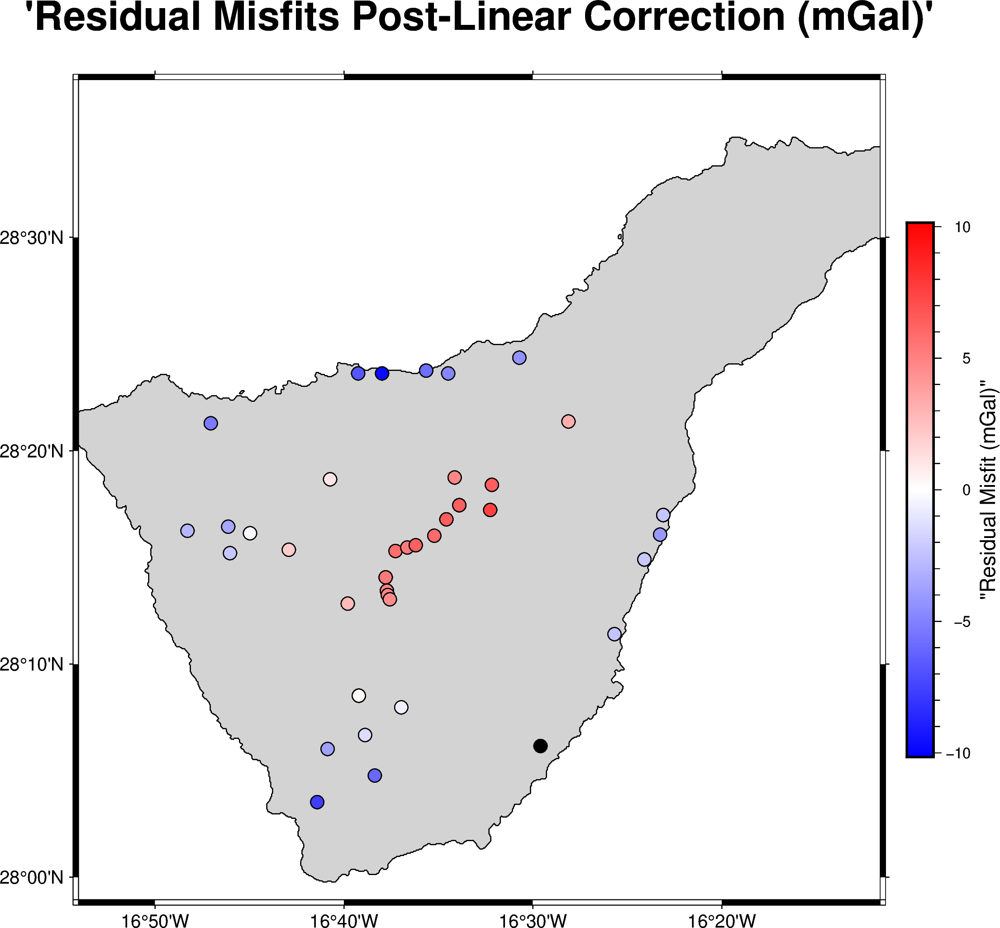


🎉 Carte linéaire générée et sauvegardée sous 'map_post_linear_misfit_ajustee.png' !


In [35]:
# =======================================================================
# VÉRIFICATION DES MISFITS POST-CORRECTION LINÉAIRE
# =======================================================================
post_pairs_lin = []

for idx, row in df_gra_lin.iterrows():
    voisins_idx = tree_ref_lin.query_ball_point([row["longitude"], row["latitude"]], r=search_radius_lin)
    for v_idx in voisins_idx:
        voisin = df_ref_lin.iloc[v_idx]
        misfit_corr_lin = row["G_ref"] - voisin["G_ref"]
        
        post_pairs_lin.append({
            "longitude": row["longitude"],
            "latitude": row["latitude"],
            "misfit": misfit_corr_lin
        })

df_post_misfit_lin = pd.DataFrame(post_pairs_lin)

print("\n📊 VERIFICATION STATISTIQUE DU MODÈLE LINÉAIRE :")
print(df_post_misfit_lin["misfit"].describe())

# =======================================================================
# CARTOGRAPHIE PYGMT AJUSTÉE (RÉSIDUS LINÉAIRES)
# =======================================================================
margin_lin = 0.05
region_lin = [
    df_merged_final["longitude"].min() - margin_lin, df_merged_final["longitude"].max() + margin_lin,
    df_merged_final["latitude"].min() - margin_lin, df_merged_final["latitude"].max() + margin_lin
]

fig_lin = pygmt.Figure()
fig_lin.coast(
    region=region_lin, projection="M15c", shorelines="1/0.5p,black", 
    land="lightgray", water="white",
    frame=["a", "WSne+t'Residual Misfits Post-Linear Correction (mGal)'"]
)

# On calcule le max absolu des résidus pour caler la colorbar proprement
post_max_lin = df_post_misfit_lin["misfit"].abs().max()
pygmt.makecpt(cmap="polar", series=[-post_max_lin, post_max_lin], continuous=True)

# Tracé des points
fig_lin.plot(
    x=df_post_misfit_lin["longitude"], y=df_post_misfit_lin["latitude"], 
    style="c0.25c", fill=df_post_misfit_lin["misfit"], cmap=True, pen="0.5p,black"
)

# Ajout de la barre d'échelle
fig_lin.colorbar(frame=['x+l"Residual Misfit (mGal)"'], position="JMR+o0.5c/0c+w10c/0.5c")

# Sauvegarde de la figure
fig_lin.savefig("map_post_linear_misfit_ajustee.png", dpi=300)
fig_lin.show()

print("\n🎉 Carte linéaire générée et sauvegardée sous 'map_post_linear_misfit_ajustee.png' !")

## Quadratic fit 

In [107]:
# 1. Chargement du bloc de référence
df_ref_quad = pd.read_csv("Tenerife_Reference_Combined_IGN_CSIC_AP.csv")
df_ref_quad["G_ref"] = df_ref_quad["G_offset"]

# 2. Isolation de GRA depuis df_merged_final
df_gra_quad = df_merged_final[df_merged_final["source_dataset"] == "GRA"].copy()

# =======================================================================
# SPATIAL PAIRING (Rayon : 0.001)
# =======================================================================
coords_ref_quad = df_ref_quad[["longitude", "latitude"]].values
tree_ref_quad = cKDTree(coords_ref_quad)

search_radius_quad = 0.001
initial_pairs_quad = []

for idx, row in df_gra_quad.iterrows():
    voisins_idx = tree_ref_quad.query_ball_point([row["longitude"], row["latitude"]], r=search_radius_quad)
    for v_idx in voisins_idx:
        voisin = df_ref_quad.iloc[v_idx]
        initial_pairs_quad.append({
            "gra_idx": idx, "longitude": row["longitude"], "latitude": row["latitude"],
            "misfit": row["G_offset"] - voisin["G_ref"]
        })

df_init_misfit_quad = pd.DataFrame(initial_pairs_quad)
print(f"🔍 {len(df_init_misfit_quad)} liaisons prêtes pour le modèle parabolique.")

🔍 45 liaisons prêtes pour le modèle parabolique.


In [108]:
# =======================================================================
# INVERSION MATHÉMATIQUE : MODÈLE QUADRATIQUE (DEGRÉ 2)
# =======================================================================
# Équation : misfit = a + b*x + c*y + d*xy + e*x² + f*y²
G_quad = np.zeros((len(df_init_misfit_quad), 6))
G_quad[:, 0] = 1.0                                     # Intercept (a)
G_quad[:, 1] = df_init_misfit_quad["longitude"].values # b * x
G_quad[:, 2] = df_init_misfit_quad["latitude"].values  # c * y
G_quad[:, 3] = df_init_misfit_quad["longitude"].values * df_init_misfit_quad["latitude"].values # d * xy
G_quad[:, 4] = df_init_misfit_quad["longitude"].values ** 2 # e * x²
G_quad[:, 5] = df_init_misfit_quad["latitude"].values ** 2  # f * y²

Z_quad = df_init_misfit_quad["misfit"].values

# Résolution
coeff_quad, _, _, _ = np.linalg.lstsq(G_quad, Z_quad, rcond=None)

print("\n==================================================")
print("📐 COEFFICIENTS QUADRATIQUES EXTRAITS :")
print("==================================================")
for idx, c in enumerate(coeff_quad):
    print(f"-> Paramètre P{idx} : {c:+.4f}")
print("==================================================")

# Application de la correction courbe sur tout le catalogue GRA
predicted_quad_warp = (coeff_quad[0] + 
                      coeff_quad[1] * df_gra_quad["longitude"] + 
                      coeff_quad[2] * df_gra_quad["latitude"] + 
                      coeff_quad[3] * (df_gra_quad["longitude"] * df_gra_quad["latitude"]) +
                      coeff_quad[4] * (df_gra_quad["longitude"] ** 2) + 
                      coeff_quad[5] * (df_gra_quad["latitude"] ** 2))

df_gra_quad["G_ref"] = df_gra_quad["G_offset"] - predicted_quad_warp
print("✅ Nouvelle colonne 'G_ref' créée pour GRA (Modèle Quadratique).")


📐 COEFFICIENTS QUADRATIQUES EXTRAITS :
-> Paramètre P0 : -509521.3540
-> Paramètre P1 : -11911.3890
-> Paramètre P2 : +29066.8941
-> Paramètre P3 : +195.3070
-> Paramètre P4 : -192.0697
-> Paramètre P5 : -457.1404
✅ Nouvelle colonne 'G_ref' créée pour GRA (Modèle Quadratique).


makecpt [WARNING]: Without inc in -T option, -Z has no effect (ignored)



📊 VERIFICATION STATISTIQUE DU MODÈLE QUADRATIQUE :
count    4.500000e+01
mean    -2.918268e-09
std      1.588534e+00
min     -4.216888e+00
25%     -6.590336e-01
50%     -3.088813e-01
75%      8.348412e-01
max      5.213000e+00
Name: misfit, dtype: float64


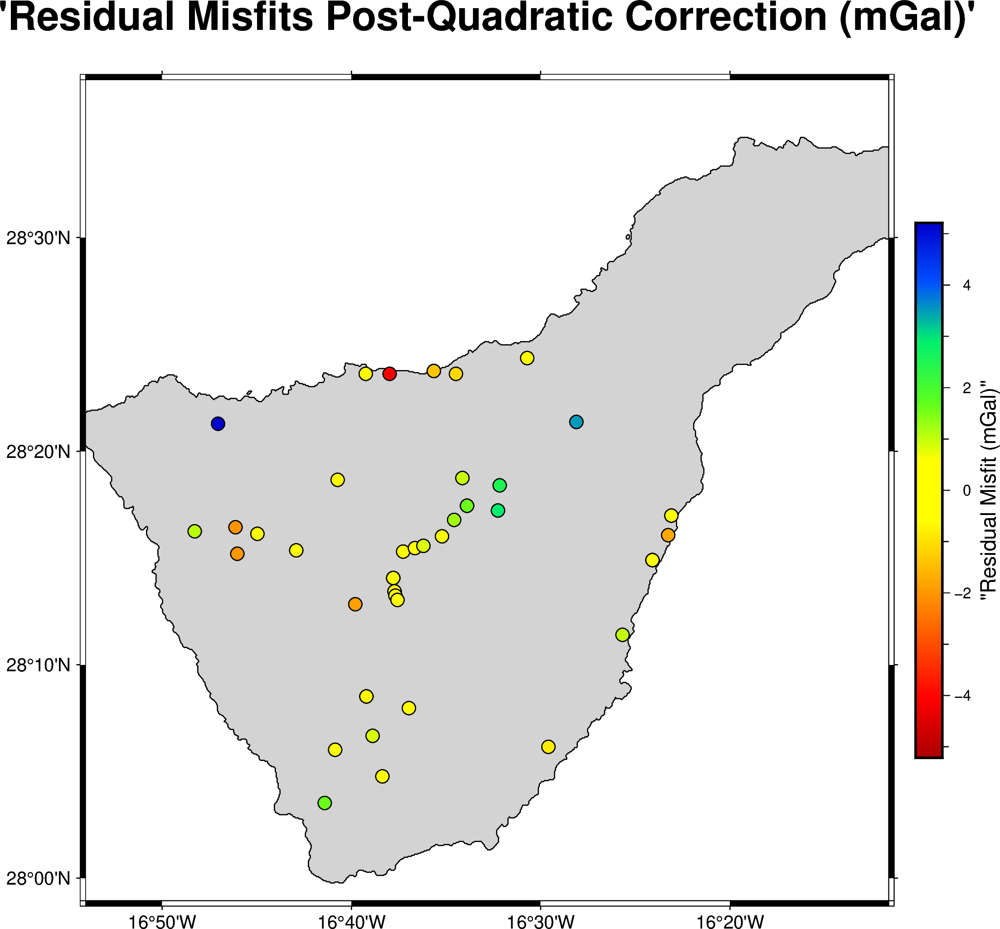

In [109]:
# =======================================================================
# VÉRIFICATION DES MISFITS POST-CORRECTION QUADRATIQUE
# =======================================================================
post_pairs_quad = []

for idx, row in df_gra_quad.iterrows():
    voisins_idx = tree_ref_quad.query_ball_point([row["longitude"], row["latitude"]], r=search_radius_quad)
    for v_idx in voisins_idx:
        voisin = df_ref_quad.iloc[v_idx]
        post_pairs_quad.append({
            "longitude": row["longitude"], "latitude": row["latitude"],
            "misfit": row["G_ref"] - voisin["G_ref"]
        })

df_post_misfit_quad = pd.DataFrame(post_pairs_quad)

print("\n📊 VERIFICATION STATISTIQUE DU MODÈLE QUADRATIQUE :")
print(df_post_misfit_quad["misfit"].describe())

# =======================================================================
# CARTOGRAPHIE PYGMT (RÉSIDUS QUADRATIQUES)
# =======================================================================
region_quad = [df_merged_final["longitude"].min() - 0.05, df_merged_final["longitude"].max() + 0.05,
               df_merged_final["latitude"].min() - 0.05, df_merged_final["latitude"].max() + 0.05]

fig_quad = pygmt.Figure()
fig_quad.coast(region=region_quad, projection="M15c", shorelines="1/0.5p,black", land="lightgray", water="white",
               frame=["a", "WSne+t'Residual Misfits Post-Quadratic Correction (mGal)'"])

post_max_quad = df_post_misfit_quad["misfit"].abs().max()
pygmt.makecpt(cmap="seis", series=[-post_max_quad, post_max_quad], continuous=True)

fig_quad.plot(x=df_post_misfit_quad["longitude"], y=df_post_misfit_quad["latitude"], 
              style="c0.25c", fill=df_post_misfit_quad["misfit"], cmap=True, pen="0.5p,black")

fig_quad.colorbar(frame=['x+l"Residual Misfit (mGal)"'], position="JMR+o0.5c/0c+w10c/0.5c")
fig_quad.savefig("carte_post_quadratic_misfit_ajustee.png", dpi=300)
fig_quad.show()

In [110]:
import pandas as pd

print("📦 Recomposition du catalogue global corrigé...")

# 1. Préparation des 3 blocs de référence (AP, CSIC, IGN) avec leur colonne G_ref
# On utilise la variable df_ref_quad issue de l'étape précédente qui contient déjà leur G_ref
df_ref_final = df_ref_quad.copy()

# 2. Préparation du bloc GRA corrigé par le modèle quadratique
df_gra_final = df_gra_quad.copy()

# 3. Fusion de tous les datasets ensemble
df_final_all = pd.concat([df_ref_final, df_gra_final], ignore_index=True)
df_final_all = df_final_all.drop(columns=['G_offset'])

# 4. Nettoyage cosmétique pour avoir un fichier parfait
# On s'assure de ne garder que les colonnes essentielles pour la suite de ton projet
#columns_to_keep = ["id", "latitude", "longitude", "source_dataset", "G_ref"]
#df_final_all = df_final_all[[c for c in columns_to_keep if c in df_final_all.columns]]

# Sauvegarde physique du fichier final de ton projet
output_csv = "Tenerife_Gravity_Complete_Disturbance_All_Datastes.csv"
df_final_all.to_csv(output_csv, index=False)

print(f"🎉 SUCCÈS ! Le catalogue final unique a été sauvegardé sous '{output_csv}'")
print(f"📊 Nombre total de stations exportées (avec GRA corrigé) : {len(df_final_all)}")
print(f"📍 Répartition par dataset : {df_final_all['source_dataset'].value_counts().to_dict()}")

📦 Recomposition du catalogue global corrigé...
🎉 SUCCÈS ! Le catalogue final unique a été sauvegardé sous 'Tenerife_Gravity_Complete_Disturbance_All_Datastes.csv'
📊 Nombre total de stations exportées (avec GRA corrigé) : 1172
📍 Répartition par dataset : {'IGN': 541, 'GRA': 377, 'AP': 159, 'CSIC': 95}


In [111]:
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree

# On crée une copie de travail pour ne pas corrompre ton df_merged_final d'origine
df_verif = df_final_all.copy()

# =======================================================================
# 2. CALCUL DES MISFITS APRÈS OPTIMISATION (RAYON 200M | SANS GRADIENT)
# =======================================================================
print("\n🧮 Calcul de la matrice des misfits post-optimisation...")

datasets_list = ["IGN", "CSIC", "AP", "GRA"]
search_radius_200m = 0.001  
results_post_opti = []

for d1 in datasets_list:
    for d2 in datasets_list:
        if d1 == d2:
            continue
            
        df1 = df_verif[df_verif["source_dataset"] == d1].copy()
        df2 = df_verif[df_verif["source_dataset"] == d2].copy()
        
        if len(df1) == 0 or len(df2) == 0:
            continue
            
        coords_2 = df2[["longitude", "latitude"]].values
        tree_2 = cKDTree(coords_2)
        
        ecarts_couple = []
        
        for idx, row in df1.iterrows():
            voisins_idx = tree_2.query_ball_point([row["longitude"], row["latitude"]], r=search_radius_200m)
            
            for v_idx in voisins_idx:
                voisin = df2.iloc[v_idx]
                
                # 💡 VERIFICATION : On compare les G_offset RECALÉS et SANS gradient !
                ecart = row["G_ref"] - voisin["G_ref"]
                ecarts_couple.append(ecart)
        
        if len(ecarts_couple) > 0:
            results_post_opti.append({
                "Base D1": d1,
                "Comparée à D2": d2,
                "Nb paires (<100m)": len(ecarts_couple),
                "Moyenne Écart (mGal)": np.mean(ecarts_couple),
                "Écart-Type (mGal)": np.std(ecarts_couple)
            })

# Affichage du résultat final
df_matrix_post = pd.DataFrame(results_post_opti)
print("\n📋 MATRICE DES MISFITS FINALE (POST-OPTIMISATION) :")
print(df_matrix_post.to_string(index=False))



🧮 Calcul de la matrice des misfits post-optimisation...

📋 MATRICE DES MISFITS FINALE (POST-OPTIMISATION) :
Base D1 Comparée à D2  Nb paires (<100m)  Moyenne Écart (mGal)  Écart-Type (mGal)
    IGN            AP                 10         -1.136868e-14           0.309175
    IGN           GRA                 33          2.201327e-01           1.354786
   CSIC            AP                  3          9.473903e-15           0.449661
   CSIC           GRA                  3         -1.793878e+00           1.310487
     AP           IGN                 10          1.136868e-14           0.309175
     AP          CSIC                  3         -9.473903e-15           0.449661
     AP           GRA                  9         -2.091938e-01           1.933984
    GRA           IGN                 33         -2.201327e-01           1.354786
    GRA          CSIC                  3          1.793878e+00           1.310487
    GRA            AP                  9          2.091938e-01         

# FINAL PLOT MERGING ALL DATASETS

makecpt [WARNING]: Without inc in -T option, -Z has no effect (ignored)


📦 Chargement du dataset corrigé...


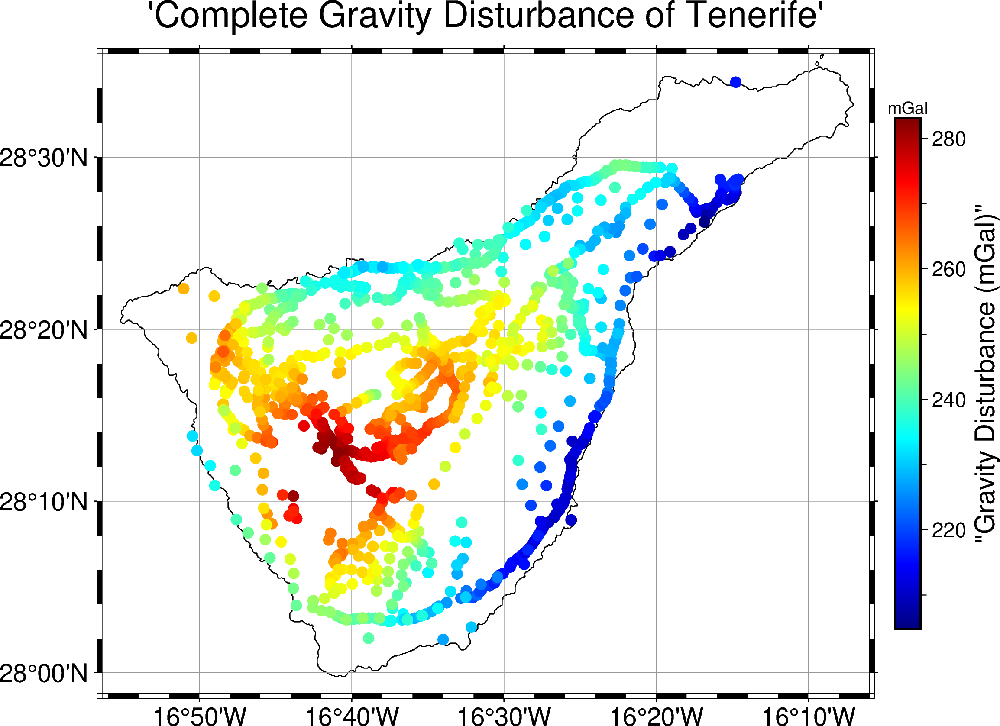

🎉 Carte de contrôle générée avec succès sous 'Map_Complete_Grav_Dist.png' !


In [113]:
import pandas as pd
import pygmt

# =======================================================================
# 1. CHARGEMENT DU CATALOGUE GLOBAL TOTALEMENT CORRIGÉ
# =======================================================================
print("📦 Chargement du dataset corrigé...")
df_plot = pd.read_csv("Tenerife_Gravity_Complete_Disturbance_All_Datastes.csv")

# Titre personnalisé pour la carte sans exclusion
titre_carte = "Complete Gravity Disturbance of Tenerife"

# =======================================================================
# 2. CONFIGURATION GÉOGRAPHIQUE (SANS TOPO)
# =======================================================================
region_Tenerife = [-16.94, -16.1, 27.98, 28.6]

# Initialisation de la figure PyGMT
fig = pygmt.Figure()

# Application de la configuration globale optionnelle pour des textes propres
pygmt.config(
    MAP_GRID_PEN_PRIMARY="0.3p,gray60",
    FONT_ANNOT_PRIMARY="14p,Helvetica", 
    FONT_LABEL="18p,Helvetica",         
    FONT_TITLE="20p,Helvetica",          
    MAP_TITLE_OFFSET="-0.1c",
)

# Configuration du fond de carte et de la côte (fond blanc, pas de relief terra)
fig.coast(
    region=region_Tenerife,
    projection="M15c",
    shorelines="1/0.5p,black",
    water="white",
    frame=["afg", f"WSne+t'{titre_carte}'"]
)

# =======================================================================
# 3. CRÉATION DE LA CPT 'JET' MULTICOLORE SUR LES DONNÉES G_REF
# =======================================================================
g_min = df_plot["G_ref"].min() - 0.5
g_max = df_plot["G_ref"].max() + 0.5

pygmt.makecpt(
    cmap="jet",
    series=[g_min, g_max],
    continuous=True
)

# =======================================================================
# 4. TRACÉ SIMPLIFIÉ DE TOUTES LES DONNÉES SANS EXCLUSION
# =======================================================================
# On affiche l'intégralité des points (AP, CSIC, IGN, GRA) d'un seul coup
fig.plot(
    x=df_plot["longitude"],
    y=df_plot["latitude"],
    style="c0.22c",              # Taille des cercles demandée (0.22 cm)
    fill=df_plot["G_ref"],       # Utilisation des valeurs corrigées unifiées
    cmap=True                    # Utilise la CPT 'jet' active
    # pen="0.1p,black"           # Optionnel : réactive pour ajouter un contour noir autour des points
)

# =======================================================================
# 5. BARRE DE COULEURS DE CONTRÔLE
# =======================================================================
fig.colorbar(
    frame=['x+l"Gravity Disturbance (mGal)"', 'y+lmGal'],
    position="JMR+o0.5c/0c+w10c/0.5c" 
)

# =======================================================================
# 6. EXPORT ET AFFICHAGE
# =======================================================================
output_control_map = "Map_Complete_Grav_Dist.png"
fig.savefig(output_control_map, dpi=600)
fig.show()

print(f"🎉 Carte de contrôle générée avec succès sous '{output_control_map}' !")